# BLG634E - Homework 3: Camera Calibration & Augmented Reality

###  Bengisu Guresti - 504191557

## Task 1: Camera Calibration

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import cv2
import re
import scipy.io as sio

from glob import glob
from copy import deepcopy
from stl import mesh
from mpl_toolkits import mplot3d

%matplotlib inline

### First, we’ll need some images to perform the calibration. Use the images from Checkerboard folder. These images are obtained through stereo vision. The files cameraParamsLeft.mat and cameraParamsRight.mat contain camera parameters for each camera.


Read photos taken from left camera:

In [2]:
file_seq_left = [im for im in glob('hw3_material/Checkerboard/raw-left*.png')]
sorted_file_seq_left = sorted(file_seq_left, key=lambda x:int(re.findall("(\d+)",x)[1]))
raw_left = np.array([plt.imread(f) for f in sorted_file_seq_left])
raw_left.shape

(21, 480, 640, 3)

Read photos taken from right camera:

In [3]:
file_seq_right = [im for im in glob('hw3_material/Checkerboard/raw-right*.png')]
sorted_file_seq_right = sorted(file_seq_right, key=lambda x:int(re.findall("(\d+)",x)[1]))
raw_right = np.array([plt.imread(f) for f in sorted_file_seq_right])
raw_right.shape

(17, 480, 640, 3)

Display photos taken from left camera:

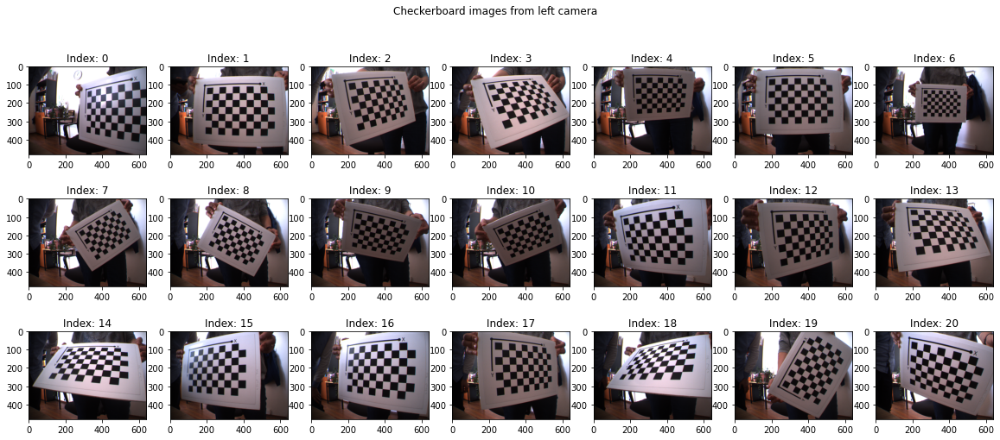

In [4]:
plt.figure(figsize = (20, 8))
for i in range(len(raw_left)):
    plt.subplot(3, 7, i + 1)
    plt.imshow(raw_left[i])
    plt.title("Index: {}".format(i))
plt.suptitle("Checkerboard images from left camera")
plt.savefig("Checkerboard_images_from_left_camera")

Display photos taken from right camera:

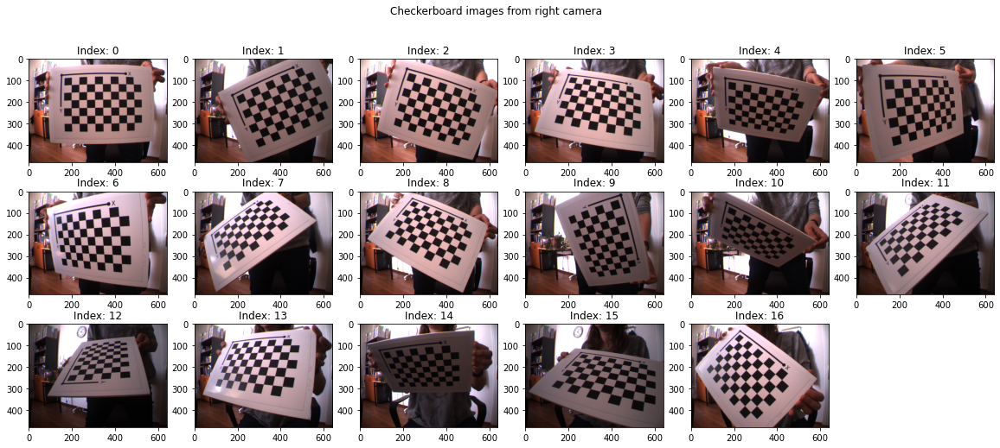

In [5]:
plt.figure(figsize = (20, 8))
for i in range(len(raw_right)):
    plt.subplot(3, 6, i + 1)
    plt.imshow(raw_right[i])
    plt.title("Index: {}".format(i))
plt.suptitle("Checkerboard images from right camera")
plt.savefig("Checkerboard_images_from right_camera")

### Use camera calibration functions from OpenCV. Display a scatter plot of the reprojection errors. In practice, reprojection error of less than 1 mm is typically considered “good”, particularly for a webcam. Show the distorted images and lens undistorted images. Note the change in appearance, particularly further away from the centre of the image.

In [6]:
given_leftparam = sio.loadmat('hw3_material/LeftCameraParams.mat')
given_rightparam = sio.loadmat('hw3_material/RightCameraParams.mat')

In [7]:
given_leftparam['WorldPoints'][:5], given_leftparam['WorldPoints'][5:10]

(array([[ 0,  0],
        [ 0, 23],
        [ 0, 46],
        [ 0, 69],
        [ 0, 92]], dtype=uint8),
 array([[  0, 115],
        [ 23,   0],
        [ 23,  23],
        [ 23,  46],
        [ 23,  69]], dtype=uint8))

In [8]:
given_rightparam['WorldPoints'][:5], given_rightparam['WorldPoints'][5:10]

(array([[ 0,  0],
        [ 0, 23],
        [ 0, 46],
        [ 0, 69],
        [ 0, 92]], dtype=uint8),
 array([[  0, 115],
        [ 23,   0],
        [ 23,  23],
        [ 23,  46],
        [ 23,  69]], dtype=uint8))

Find chessboard corners, refine the corners, and saved the object points and image points for left and right images for each image:

World points are obtained from the provided .mat data. The leftmost upmost inner corner is selected as (0, 0) coordinate. As seen from the world point data for the left and right camera, 1 square has an edge of 23 mm. Since the inner corner (9 * 6) points are used for calibration, the corner points are from $[0, 0, 0, 1]$ to $[184, 115, 0, 1]$ with 23 mm gaps in each x, y dimension.

In [9]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

scale = 23

left_objp = np.zeros((9 * 6, 3), np.float32)
left_objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)
left_objp *= scale

left_objpoints = []
left_imgpoints = []

marked_raw_left = []

for img in raw_left:
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    gray = (gray * 255).astype('uint8')
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    if ret:
        left_objpoints.append(left_objp)
        corners_refined = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        left_imgpoints.append(corners_refined)
        marked_img = deepcopy(img)
        marked_img = cv2.drawChessboardCorners(marked_img, (9, 6), corners_refined, ret)
        marked_raw_left.append(marked_img)
        
right_objp = np.zeros((9 * 6, 3), np.float32)
right_objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)
right_objp *= scale

right_objpoints = []
right_imgpoints = []

marked_raw_right = []

for img in raw_right:
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    gray = (gray * 255).astype('uint8')
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    if ret:
        right_objpoints.append(right_objp)
        corners_refined = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        right_imgpoints.append(corners_refined)
        marked_img = deepcopy(img)
        marked_img = cv2.drawChessboardCorners(marked_img, (9, 6), corners_refined, ret)
        marked_raw_right.append(marked_img)

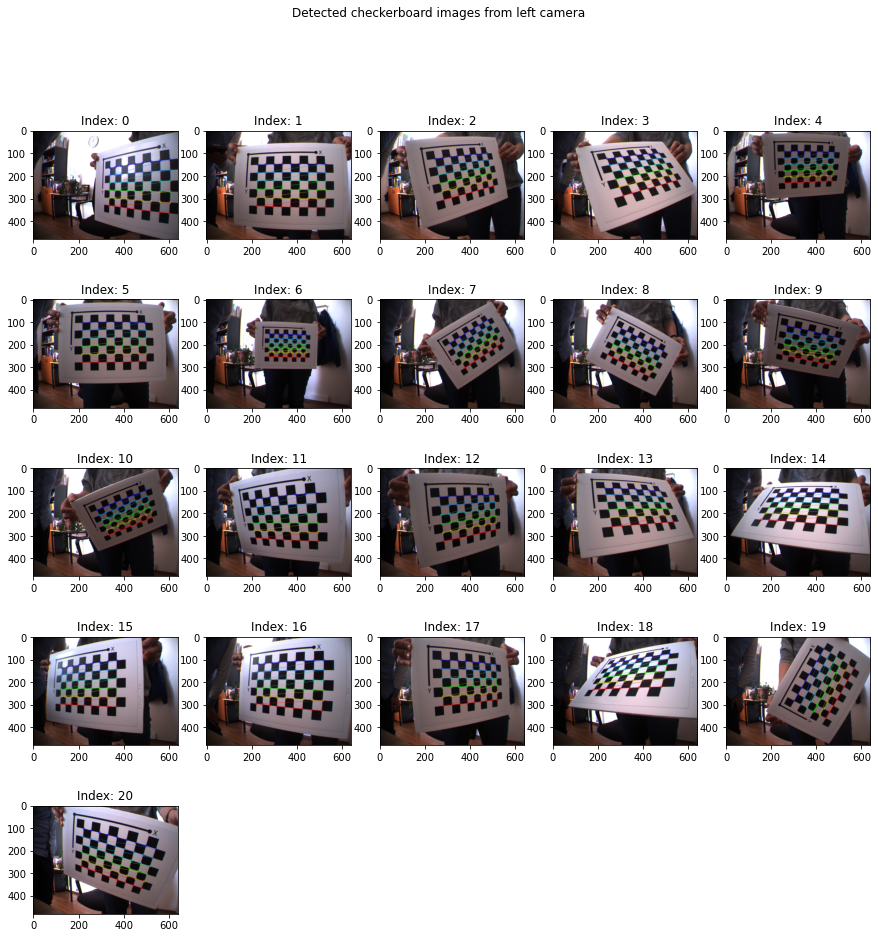

In [10]:
plt.figure(figsize = (15, 15))
for i in range(len(marked_raw_left)):
    plt.subplot(5, 5, i + 1)
    plt.imshow(marked_raw_left[i])
    plt.title("Index: {}".format(i))
plt.suptitle("Detected checkerboard images from left camera")
plt.savefig("Detected_checkerboard_images_from_left_camera")

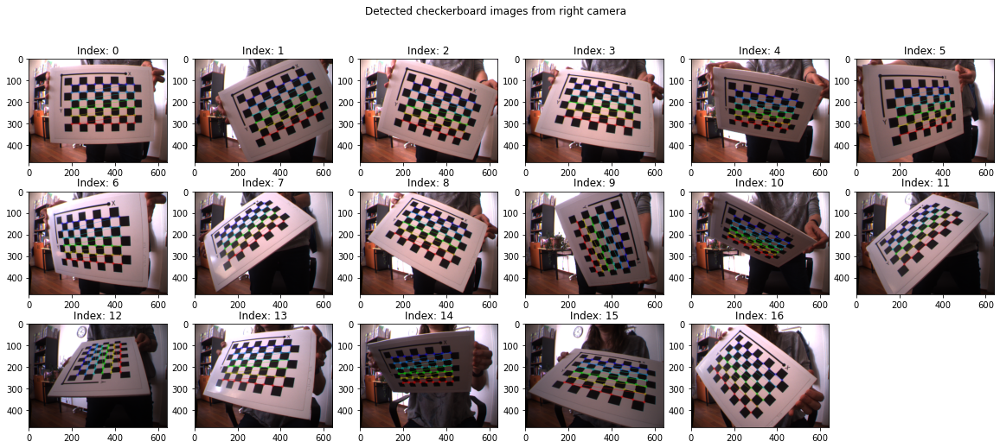

In [11]:
plt.figure(figsize = (20, 8))
for i in range(len(marked_raw_right)):
    plt.subplot(3, 6, i + 1)
    plt.imshow(marked_raw_right[i])
    plt.title("Index: {}".format(i))
plt.suptitle("Detected checkerboard images from right camera")
plt.savefig("Detected_checkerboard_images_from_right_camera")

###  Use camera calibration functions from OpenCV. Once you are finished with the final nonlinear optimization (bundle adjustment/refinement), you have the camera calibration parameters, say cameraParams.

Since OpenCV does the final nonlinear optimization (bundle adjustment) together with other steps in calibrateCamera function, camera parameters are obtained in one step which includes the bundle adjustment.

Left and right cameras are calibrated using OpenCV:

In [12]:
ret_left, mtx_left, dist_left, rvecs_left, tvecs_left = cv2.calibrateCamera(left_objpoints, \
                                                                            left_imgpoints, \
                                                                            raw_left[0][:, :, 0].shape[::-1], \
                                                                            None, None)

ret_right, mtx_right, dist_right, rvecs_right, tvecs_right = cv2.calibrateCamera(right_objpoints, \
                                                                            right_imgpoints, \
                                                                            raw_right[0][:, :, 0].shape[::-1], \
                                                                            None, None)

### Display a scatter plot of the reprojection errors. In practice, reprojection error of less than 1 mm is typically considered “good”, particularly for a webcam.

In [13]:
left_reperror = []
left_mean_error = 0

for i, objp in enumerate(left_objpoints):
    imgpoints_check, _ = cv2.projectPoints(objp, rvecs_left[i], tvecs_left[i], mtx_left, dist_left)
    error = cv2.norm(left_imgpoints[i], imgpoints_check, cv2.NORM_L2) / len(imgpoints_check)
    left_reperror.append(error)
    left_mean_error += error
    
left_mean_error /= len(left_objpoints)
print("Mean of left camera reprojection error: {} pixels".format(left_mean_error))

right_reperror = []
right_mean_error = 0

for i, objp in enumerate(right_objpoints):
    imgpoints_check, _ = cv2.projectPoints(objp, rvecs_right[i], tvecs_right[i], mtx_right, dist_right)
    error = cv2.norm(right_imgpoints[i], imgpoints_check, cv2.NORM_L2) / len(imgpoints_check)
    right_reperror.append(error)
    right_mean_error += error
    
right_mean_error /= len(right_objpoints)
print("Mean of right camera reprojection error: {} pixels".format(right_mean_error))

Mean of left camera reprojection error: 0.020121432488652776 pixels
Mean of right camera reprojection error: 0.05347118328647376 pixels


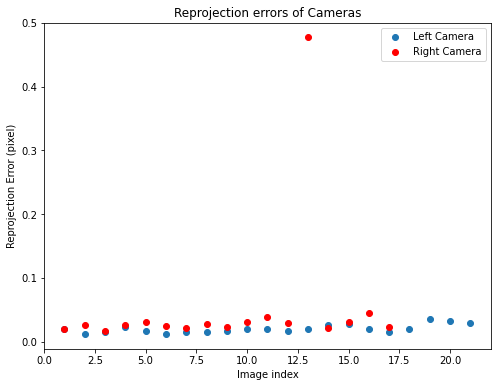

In [14]:
plt.figure(figsize = (8, 6))
plt.scatter(range(1, len(left_reperror) + 1), left_reperror, label='Left Camera')
plt.scatter(range(1, len(right_reperror) + 1), right_reperror, c='r', label='Right Camera')
plt.xlabel('Image index')
plt.ylabel('Reprojection Error (pixel)')
plt.legend()
plt.title("Reprojection errors of Cameras")
plt.savefig("Reprojection_errors_of_Cameras")

According to the mean results and the plots, the reprojection errors show good calibration for left and right camera. There is only 1 outlier for right camera with error close to 0.5 pixels. All of the other errors are strictly below 0.1 pixels with a mean reprojection error of $0.020121432488652776$ pixel for left camera and mean reprojection error of $0.05347118328647376$ pixels for right camera.

### Show the distorted images and lens undistorted images. Note the change in appearance, particularly further away from the centre of the image.

A new camera matrix is obtained to use during undistortion in order to adjust undistorted results according to how many pixels we intend to keep or lose. This is determined by a free scaling parameter alpha which is 0 for returning only sensible pixels, 1 for keep all pixels in the original image and in between for mediation between these two options.

Since I don't want to have unwanted pixels, I choose alpha as 0 and get new refined intrinsic camera matrices for left and right cameras:

In [15]:
h,  w = raw_left[0].shape[:2]
undist_mtx_left, roi_left = cv2.getOptimalNewCameraMatrix(mtx_left, dist_left, (w,h), 0, (w,h))

h,  w = raw_right[0].shape[:2]
undist_mtx_right, roi_right = cv2.getOptimalNewCameraMatrix(mtx_right, dist_right, (w,h), 0, (w,h))


Images are undistorted using OpenCV's undistort function and obtained matrices:

In [16]:
undist_left = []

for img in raw_left:
    undist_img = deepcopy(img)
    undist_img = cv2.undistort(img, mtx_left, dist_left, None, undist_mtx_left)
    undist_left.append(undist_img)
    
undist_right = []

for img in raw_right:
    undist_img = deepcopy(img)
    undist_img = cv2.undistort(img, mtx_right, dist_right, None, undist_mtx_right)
    undist_right.append(undist_img)

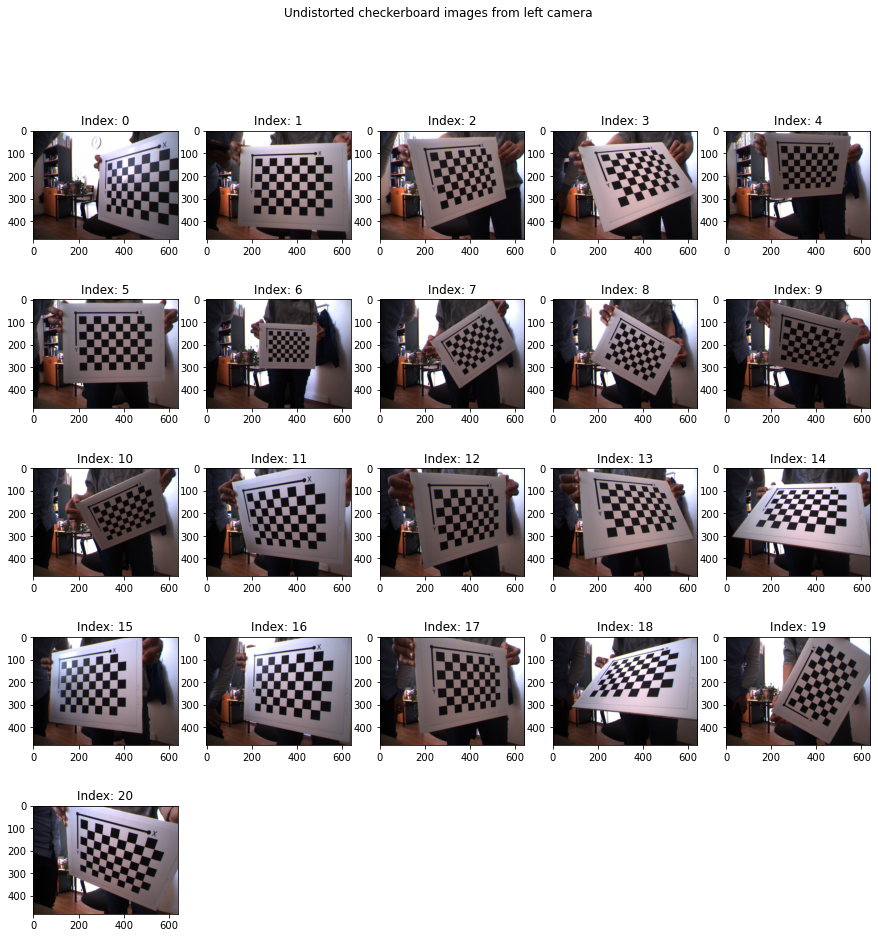

In [17]:
plt.figure(figsize = (15, 15))
for i in range(len(undist_left)):
    plt.subplot(5, 5, i + 1)
    plt.imshow(undist_left[i])
    plt.title("Index: {}".format(i))
plt.suptitle("Undistorted checkerboard images from left camera")
plt.savefig("Undistorted_checkerboard_images_from_left_camera")

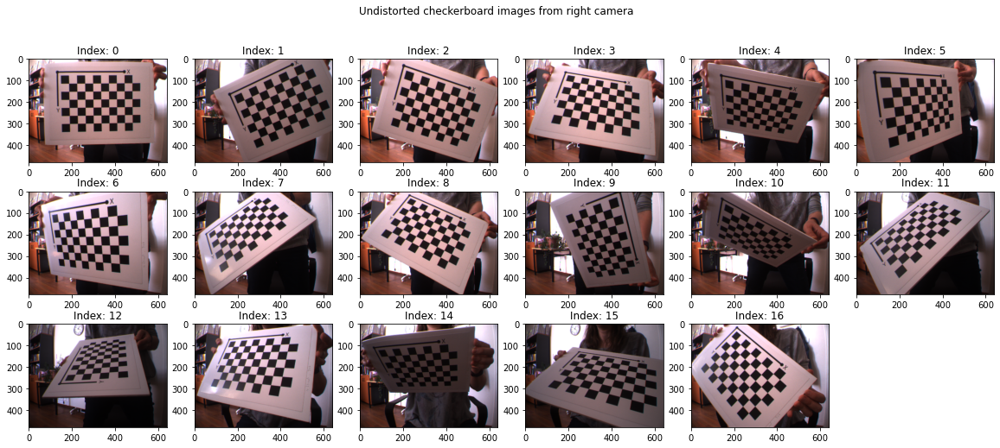

In [18]:
plt.figure(figsize = (20, 8))
for i in range(len(undist_right)):
    plt.subplot(3, 6, i + 1)
    plt.imshow(undist_right[i])
    plt.title("Index: {}".format(i))
plt.suptitle("Undistorted checkerboard images from right camera")
plt.savefig("Undistorted_checkerboard_images_from_right_camera")

The edges of the checkerboard in the undistorted images look straight unlike distorted raw images which have curved checkerboard edges. It can be seen in the distorted images that the curving effect of distortion is higher as pixels get further away from the center of the image. It can be seen from the undistorted images (right camera at index 5 the most), undistorting the image is more difficult as pixels get further away from the center of the image such that although curving effect is remedied it is still available, although barely, in some unfortunate examples.

### First, check the camera intrinsics, in terms of the focal lengths, principal point (centre of image), skew, lens distortion, and intrinsic matrix. There should be also N sets of extrinsic parameters, one for each image. Now, form you full camera projection matrix M.

OpenCV calibrates the camera for the intrinsic camera matrix $A = \begin{bmatrix} f_x & 0 & c_x \\
                                                                                  0 & f_y & c_y \\
                                                                                  0 & 0 & 0 \end{bmatrix}$
where $f_x$ and $f_x$ focal lengths of pixels and $c_x$ and $c_y$ pair is the principle point. Skew is assumed to be 0 thus the final result has a skew of 0.

In [19]:
mtx_left

array([[529.37954295,   0.        , 347.15652115],
       [  0.        , 527.64565934, 259.22061406],
       [  0.        ,   0.        ,   1.        ]])

In [20]:
dist_left

array([[-3.20776092e-01,  2.37213498e-01, -4.13064900e-04,
         1.96766305e-04, -1.56586021e-01]])

Left camera has $f_x = 529.37954295$ and $f_y = 527.64565934$ as focal lengths and principle point as $[347.15652115, 259.22061406]$ with a skew of $0$.

Left camera has radial distortion coefficients $k_1 = -3.20776092e^{-01}$, $k_2 = 2.37213498e^{-01}$, $k_3 = -1.56586021e^{-01}$ and tangential distortion coefficients $p_1 = -4.13064900e^{-04}$ and $p_2 = 1.96766305e^{-04}$. It should be noted that tangential distortion is relatively small.

In [21]:
mtx_right

array([[526.33553876,   0.        , 353.20168717],
       [  0.        , 524.87340445, 248.71105297],
       [  0.        ,   0.        ,   1.        ]])

In [22]:
dist_right

array([[-2.79418399e-01, -1.78031167e-01,  1.36169140e-03,
        -8.48912779e-05,  8.82349166e-01]])

Right camera has $f_x = 526.33553876$ and $f_y = 524.87340445$ as focal lengths and principle point as $[353.20168717, 248.71105297]$ with a skew of $0$.

Right camera has radial distortion coefficients $k_1 = -2.79418399e^{-01}$, $k_2 = -1.78031167e^{-01}$, $k_3 = 8.82349166e^{-01}$ and tangential distortion coefficients $p_1 = 1.36169140e^{-03}$ and $p_2 = -8.48912779e^{-05}$. It should be noted that tangential distortion is relatively small.

In [23]:
len(rvecs_left), len(tvecs_left), len(rvecs_right), len(tvecs_right)

(21, 21, 17, 17)

There are 21 sets of extrinsic parameters for left camera and left images and 17 sets of extrinsic parameters for right camera and right images.

Full camera projection matrices are formed for left and right camera using rotation functions from homework1:

Since these projections are to be used in augmented reality application and the base will be the undistorted images, the refined intrinsic camera matrices (for undistortion) are used in full projection matrix computations.

In [24]:
# function to get rotation matrix by rodrigues formula from homework 1

# function to convert angle w to its hat operator
to_hat = lambda w : np.array([[0, -w[2], w[1]], [w[2], 0, -w[0]], [-w[1], w[0], 0]])

# for exponential coordinate representation (angle to rotate norm of axis vector)
def rodrig(w):
    """
    :param w: rotation axis
    :return: rotation matrix
    """
    w_hat = to_hat(w)
    w_norm = np.linalg.norm(w)
    rot = np.eye(3) + (w_hat / w_norm) * np.sin(w_norm) + \
          (np.dot(w_hat, w_hat) / (w_norm ** 2)) * (1 - np.cos(w_norm))
    return rot

# function to convert 3x3 rotation matrix to its 4x4 equivalent
def rot4d(rot):
    rot = np.append(rot, np.zeros((3, 1)), axis=1)
    rot = np.append(rot, np.zeros((1, 4)), axis=0)
    rot[-1, -1] = 1
    return rot

In [25]:
M_left = []
for i in range(len(raw_left)):
    g = np.concatenate((rodrig(rvecs_left[i].reshape(-1)), tvecs_left[i]), axis=1)
    g = np.concatenate((g, np.array([[0, 0, 0, 1]])), axis=0) # extrinsic calibaration parameters
    pi = np.array([[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 1, 0]]) # perspective projection matrix
    M = undist_mtx_left @ pi @ g
    M_left.append(M)
M_left = np.array(M_left)
    
M_right = []
for i in range(len(raw_right)):
    g = np.concatenate((rodrig(rvecs_right[i].reshape(-1)), tvecs_right[i]), axis=1)
    g = np.concatenate((g, np.array([[0, 0, 0, 1]])), axis=0) # extrinsic calibaration parameters
    pi = np.array([[1, 0, 0, 0], [0, 1, 0, 0], [0, 0, 1, 0]])  # perspective projection matrix
    M = undist_mtx_right @ pi @ g
    M_right.append(M)
M_right = np.array(M_right)

In [26]:
M_left.shape, M_right.shape

((21, 3, 4), (17, 3, 4))

In [27]:
M_right[0]

array([[5.24464450e+02, 1.36338182e+01, 3.27716760e+02, 5.99885037e+04],
       [5.27684506e-01, 5.26305246e+02, 2.37573185e+02, 3.68577590e+04],
       [3.20809299e-02, 1.92922826e-02, 9.99299065e-01, 3.20373129e+02]])

In [28]:
M_left[0]

array([[ 7.57491714e+01, -1.84329485e+01,  5.81100325e+02,
         1.27214221e+05],
       [-1.82796531e+02,  4.87820117e+02,  1.98996531e+02,
         6.36548452e+04],
       [-7.11381691e-01, -1.68801062e-02,  7.02603126e-01,
         3.64993643e+02]])

## Task 2: Augmented Reality (AR)

### With the camera intrinsics and extrinsics known, we can project from 3D space into the images. To do this, we must:
### 1. Undistort the image
### 2. Compute the projection matrix
### 3. Project 3D points to 2D points

### Now: Create a new script. In this script, read and display one of the calibration images you saved however show the image in 3D space as you’ve done before. Also load the previously saved cameraParams. In your script, write code to undistort the image using the camera parameters. Then, create the projection matrix using the intrinsics, rotation matrix and rotation vector for the image. You can consult the lecture notes.

These steps are accomplished in Task 1 and displayed in the previous section of the homework.

### Then, in your script, you can project and display 3D points into the image. You can benefit from the following pseudocode.
### P = [25 0 0 1]’
### p = M*P
### p = p / p(2) scatter(p(0), p(1))
### Here, M is the overall camera calibration matrix. In this example, the P is a homogenised 3D point [25, 0, 0, 1]' , and is being projected to a 2D point p in the image. The 2D point is dehomogenised by dividing by the w component, and rendered as a yellow circle. Try other 3D points – for example, can you reproduce this image?

The yellow marked point in the given image is at world point $P =[4 \times 23, 3 \times 23, 0, 1]$. For sake of trial $P =[4 \times 23, 3 \times 23, 0, 1]$ is taken as p0 and marked with red and outer corners will be $p1 = [-23, -23, 0, 1]$, $p2 = [9 \times 23, -23, 0, 1]$, $p3 = [-23, 6 \times 23, 0, 1]$, $p4 = [9 \times 23, 6 \times 23, 0, 1]$ and marked with blue, green, cyan and magenta respectively.

The given image is reproduces as:

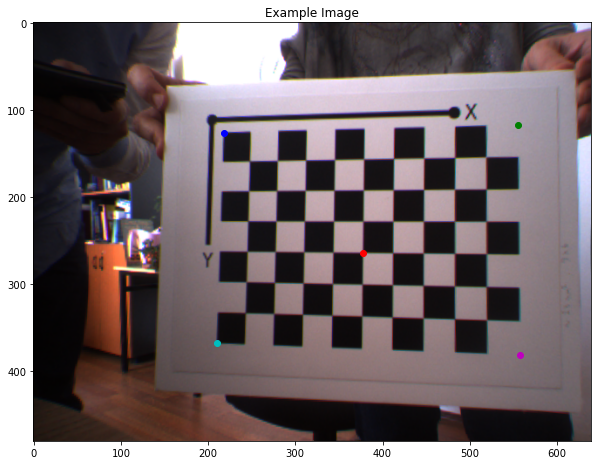

In [29]:
plt.figure(figsize = (10, 12))
p0 = np.array([4 * 23, 3 * 23, 0, 1]).T
p1 = np.array([-23, -23, 0, 1]).T
p2 = np.array([9 * 23, -23, 0, 1]).T
p3 = np.array([-23, 6 * 23, 0, 1]).T
p4 = np.array([9 * 23, 6 * 23, 0, 1]).T
p0 = M_left[1] @ p0
p0 = p0 / p0[2]
p1 = M_left[1] @ p1
p1 = p1 / p1[2]
p2 = M_left[1] @ p2
p2 = p2 / p2[2]
p3 = M_left[1] @ p3
p3 = p3 / p3[2]
p4 = M_left[1] @ p4
p4 = p4 / p4[2]
plt.imshow(undist_left[1])
plt.scatter(p0[0], p0[1], c='r')
plt.scatter(p1[0], p1[1], c='b')
plt.scatter(p2[0], p2[1], c='g')
plt.scatter(p3[0], p3[1], c='c')
plt.scatter(p4[0], p4[1], c='m')
plt.title("Example Image")
plt.savefig("Example_Image")

Locate all the specified world points on left camera images and right camera images:

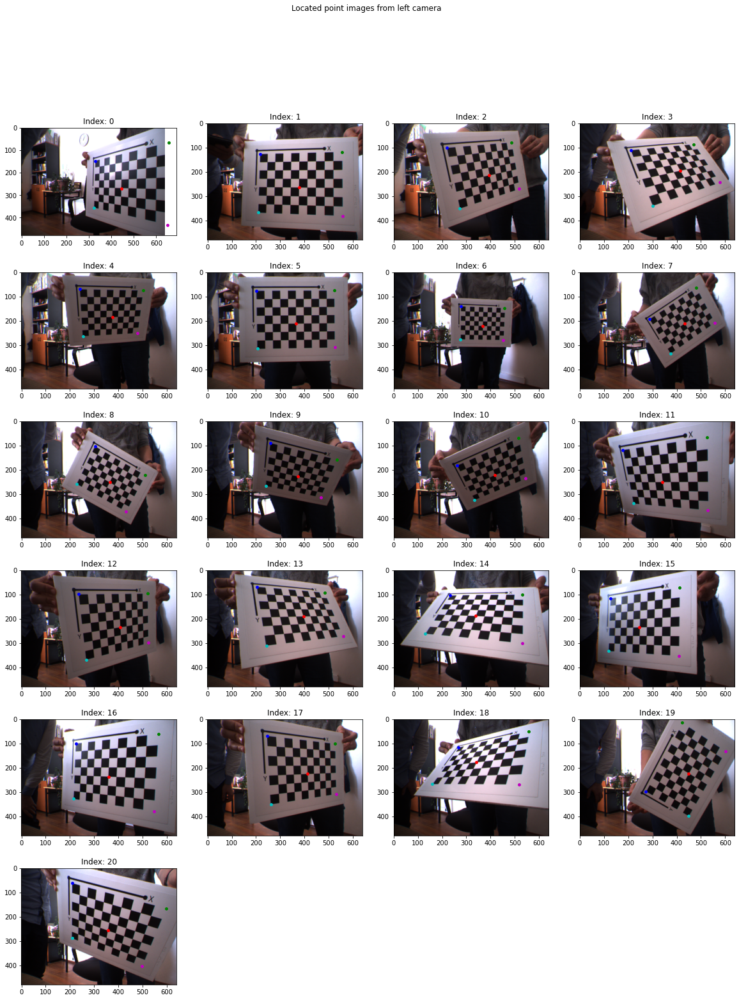

In [30]:
plt.figure(figsize = (20, 25))
for i in range(len(undist_left)):
    plt.subplot(6, 4, i + 1)
    p0 = np.array([4 * 23, 3 * 23, 0, 1]).T
    p1 = np.array([-23, -23, 0, 1]).T
    p2 = np.array([9 * 23, -23, 0, 1]).T
    p3 = np.array([-23, 6 * 23, 0, 1]).T
    p4 = np.array([9 * 23, 6 * 23, 0, 1]).T
    p0 = M_left[i] @ p0
    p0 = p0 / p0[2]
    p1 = M_left[i] @ p1
    p1 = p1 / p1[2]
    p2 = M_left[i] @ p2
    p2 = p2 / p2[2]
    p3 = M_left[i] @ p3
    p3 = p3 / p3[2]
    p4 = M_left[i] @ p4
    p4 = p4 / p4[2]
    plt.imshow(undist_left[i])
    plt.scatter(p0[0], p0[1], s=15, c='r')
    plt.scatter(p1[0], p1[1], s=15, c='b')
    plt.scatter(p2[0], p2[1], s=15, c='g')
    plt.scatter(p3[0], p3[1], s=15, c='c')
    plt.scatter(p4[0], p4[1], s=15, c='m')
    plt.title("Index: {}".format(i))
plt.suptitle("Located point images from left camera")
plt.savefig("Located_point_images_from_left_camera")

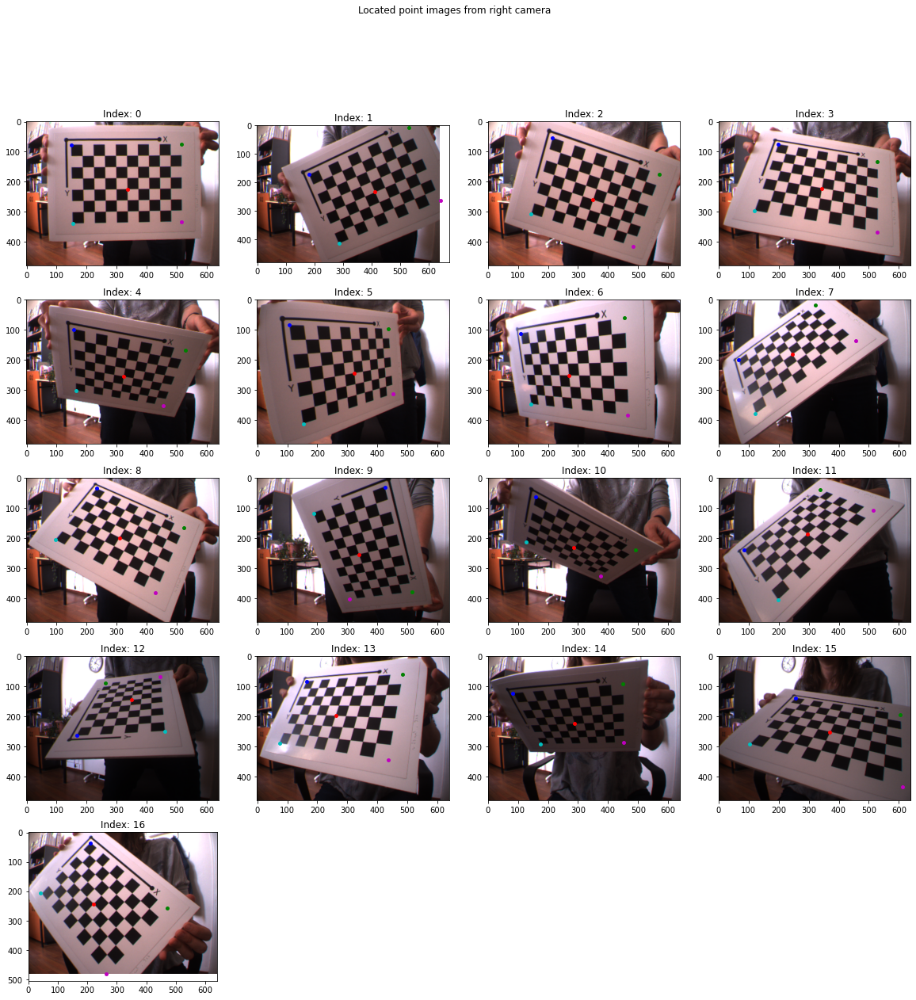

In [31]:
plt.figure(figsize = (20, 20))
for i in range(len(undist_right)):
    plt.subplot(5, 4, i + 1)
    p0 = np.array([4 * 23, 3 * 23, 0, 1]).T
    p1 = np.array([-23, -23, 0, 1]).T
    p2 = np.array([9 * 23, -23, 0, 1]).T
    p3 = np.array([-23, 6 * 23, 0, 1]).T
    p4 = np.array([9 * 23, 6 * 23, 0, 1]).T
    p0 = M_right[i] @ p0
    p0 = p0 / p0[2]
    p1 = M_right[i] @ p1
    p1 = p1 / p1[2]
    p2 = M_right[i] @ p2
    p2 = p2 / p2[2]
    p3 = M_right[i] @ p3
    p3 = p3 / p3[2]
    p4 = M_right[i] @ p4
    p4 = p4 / p4[2]
    plt.imshow(undist_right[i])
    plt.scatter(p0[0], p0[1], s=15, c='r')
    plt.scatter(p1[0], p1[1], s=15, c='b')
    plt.scatter(p2[0], p2[1], s=15, c='g')
    plt.scatter(p3[0], p3[1], s=15, c='c')
    plt.scatter(p4[0], p4[1], s=15, c='m')
    plt.title("Index: {}".format(i))
plt.suptitle("Located point images from right camera")
plt.savefig("Located_point_images_from_right_camera")

### Now, project our famous cow model into the image translated to position (A, B, Z=0) and scaled by a factor of S by using the camera matrix M. Play with different scale and translation or even rotation parameters of the model and see if you can place it onto the image as follows. The cow should be on the center of the checkerboard and you should be sure about this by rotation the plane.

Center of the checkerboard is at $[4 \times 23, 3 \times 23, 0, 1]$.

In [32]:
mesh_cow = mesh.Mesh.from_file('hw3_material/cow.stl')
COW_VECTORS = mesh_cow.vectors
COW_VECTORS = np.append(COW_VECTORS, np.ones((COW_VECTORS.shape[0], COW_VECTORS.shape[1], 1)), axis=-1)
COW_VECTORS.shape

(5804, 3, 4)

The cow is displayed below:

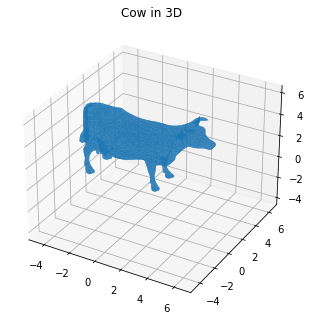

<Figure size 432x288 with 0 Axes>

In [33]:
figure = plt.figure()
axes = mplot3d.Axes3D(figure)
axes.add_collection3d(mplot3d.art3d.Poly3DCollection(COW_VECTORS[:, :, :3], alpha=0.8))
#Add the 3D faces to the created matplotlib axes
min = np.min(COW_VECTORS[:, :, :3].reshape(-1))
max = np.max(COW_VECTORS[:, :, :3].reshape(-1)) # Find minimum and maximum units 
                                           # to place the cow in a cubular grid.
axes.auto_scale_xyz([min, max], [min, max], [min, max])
plt.title("Cow in 3D")
plt.show()
plt.savefig("Cow_in_3D")

Since feet of the cow are at z = 0 and the head and body of the cow are at z > 0 such that whole cow is above z=0, and we set upper left inner corner as (0, 0) and x and y coordinates increase towards right and down in world points, when cow is put to target world coordinate its body is behind the checkerboard by the right hand rule and hence its 2D projection to z=0 plane is formed upside down. In order to prevent it from being projected upside down and translate it to world coordinates so that its body is in front of the checkerboard, cow is turned upside down (its symmetric is taken according to z=0 plane) at the beginning and then process continues as necessary. 

In [34]:
COW_VECTORS[:, :, 2] *= -1
COW_VECTORS.shape

(5804, 3, 4)

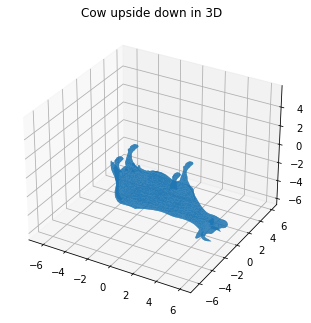

<Figure size 432x288 with 0 Axes>

In [35]:
figure = plt.figure()
axes = mplot3d.Axes3D(figure)
axes.add_collection3d(mplot3d.art3d.Poly3DCollection(COW_VECTORS[:, :, :3], alpha=0.8))
#Add the 3D faces to the created matplotlib axes
min = np.min(COW_VECTORS[:, :, :3].reshape(-1))
max = np.max(COW_VECTORS[:, :, :3].reshape(-1)) # Find minimum and maximum units 
                                           # to place the cow in a cubular grid.
axes.auto_scale_xyz([min, max], [min, max], [min, max])
plt.title("Cow upside down in 3D")
plt.show()
plt.savefig("Cow_upside_down_in_3D")

Rotation center for the cow is determined as its center of mass; thus, its center of mass has been obtained along with the translation vector to put its center of mass to origin. This translation is done by to_origin matrix. After that, the final translation is done directly from origin to the target world position with a minor detail: the cow is further translated by from_origin matrix to set its foot at z=0 and its body at z<0 while its center of mass' x and y coordinates are (0, 0).

In [36]:
center_of_mass = mesh_cow.get_mass_properties()[1]
to_origin = np.eye(4)
to_origin[:3, -1] = -center_of_mass
from_origin = np.eye(4)
from_origin[2, -1] = center_of_mass[2]

The cow is rotated around z axis $2\pi/3$ radians to get a similar rotation as given in the example picture. (If the cow was not made upside down according to its symmetric for z=0 plane, the rotation would be $-2\pi/3$ radians, but since the upside down cow is processed the rotation is $2\pi/3$ radians).

In [37]:
w1 = [0, 0, 2*np.pi/3]
rot1 = rot4d(rodrig(w1))

In [38]:
composite_rot1 = (from_origin @ (rot1 @ to_origin))
rotated_cow_origin = COW_VECTORS @ composite_rot1.T

The cow is translated to world points such that its new center of x, y is the center of the checkboard and $[4\times23, 3\times23]$ and its feet are at (approximately) z=0.

In [39]:
scale_translate = np.array([[10, 0, 0, 4 * 23],
                            [0, 10, 0, 3 * 23],
                            [0, 0, 10, 0],
                            [0, 0, 0, 1]])

rotated_cow_center = rotated_cow_origin @ scale_translate.T

Then the cow is projected onto 2D space of undistorted camera using the obtained M matrices which are formed by undistroted camera matrices. The M matrice for the following transformation belongs to left camera data with index 1 since the example is given for that image.

In [40]:
proj_cow = rotated_cow_center @ M_left[1].T
proj_cow = proj_cow / proj_cow[:, :, 2].reshape(-1, 3, 1)

The result is displayed below:

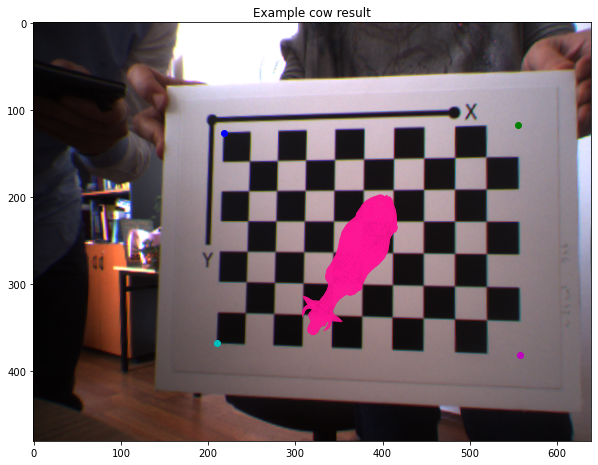

In [41]:
plt.figure(figsize = (10, 12))
for cow in proj_cow[:, :, :2]:
    triangle = cow.T
    plt.fill(triangle[0], triangle[1], "deeppink", alpha=1)
p0 = np.array([4 * 23, 3 * 23, 0, 1]).T
p1 = np.array([-23, -23, 0, 1]).T
p2 = np.array([9 * 23, -23, 0, 1]).T
p3 = np.array([-23, 6 * 23, 0, 1]).T
p4 = np.array([9 * 23, 6 * 23, 0, 1]).T
p0 = M_left[1] @ p0
p0 = p0 / p0[2]
p1 = M_left[1] @ p1
p1 = p1 / p1[2]
p2 = M_left[1] @ p2
p2 = p2 / p2[2]
p3 = M_left[1] @ p3
p3 = p3 / p3[2]
p4 = M_left[1] @ p4
p4 = p4 / p4[2]
plt.imshow(undist_left[1])
plt.scatter(p0[0], p0[1], c='r')
plt.scatter(p1[0], p1[1], c='b')
plt.scatter(p2[0], p2[1], c='g')
plt.scatter(p3[0], p3[1], c='c')
plt.scatter(p4[0], p4[1], c='m')
plt.title("Example cow result")
plt.savefig("example_cow_result")

Now, the cow is put on all the images from the left and right camera. The cow is indeed on the center of the checkerboard for all of the images. Results are displayed below for first left camera images then right camera images:

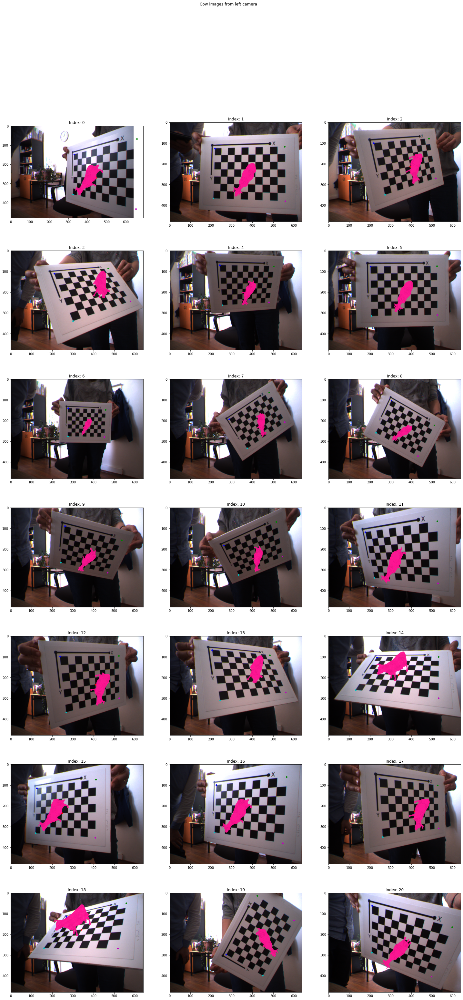

In [42]:
plt.figure(figsize = (25, 50))
for i in range(len(undist_left)):
    proj_cow = rotated_cow_center @ M_left[i].T
    proj_cow = proj_cow / proj_cow[:, :, 2].reshape(-1, 3, 1)
    plt.subplot(7, 3, i + 1)
    for cow in proj_cow[:, :, :2]:
        triangle = cow.T
        plt.fill(triangle[0], triangle[1], "deeppink", alpha=1)
    p0 = np.array([4 * 23, 3 * 23, 0, 1]).T
    p1 = np.array([-23, -23, 0, 1]).T
    p2 = np.array([9 * 23, -23, 0, 1]).T
    p3 = np.array([-23, 6 * 23, 0, 1]).T
    p4 = np.array([9 * 23, 6 * 23, 0, 1]).T
    p0 = M_left[i] @ p0
    p0 = p0 / p0[2]
    p1 = M_left[i] @ p1
    p1 = p1 / p1[2]
    p2 = M_left[i] @ p2
    p2 = p2 / p2[2]
    p3 = M_left[i] @ p3
    p3 = p3 / p3[2]
    p4 = M_left[i] @ p4
    p4 = p4 / p4[2]
    plt.imshow(undist_left[i])
    plt.scatter(p0[0], p0[1], s=15, c='r')
    plt.scatter(p1[0], p1[1], s=15, c='b')
    plt.scatter(p2[0], p2[1], s=15, c='g')
    plt.scatter(p3[0], p3[1], s=15, c='c')
    plt.scatter(p4[0], p4[1], s=15, c='m')
    plt.title("Index: {}".format(i))
plt.suptitle("Cow images from left camera")
plt.savefig('Cow_images_left_camera')

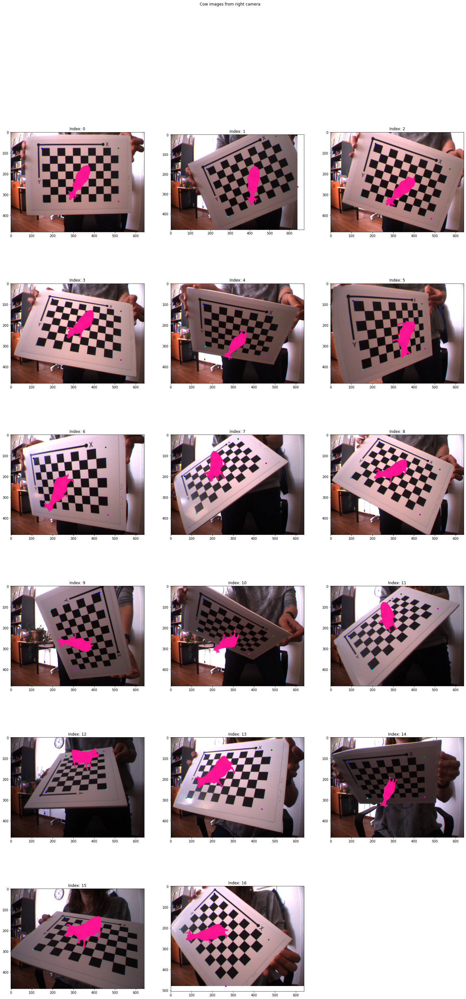

In [43]:
plt.figure(figsize = (25, 50))
for i in range(len(undist_right)):
    proj_cow = rotated_cow_center @ M_right[i].T
    proj_cow = proj_cow / proj_cow[:, :, 2].reshape(-1, 3, 1)
    plt.subplot(6, 3, i + 1)
    for cow in proj_cow[:, :, :2]:
        triangle = cow.T
        plt.fill(triangle[0], triangle[1], "deeppink", alpha=1)
    p0 = np.array([4 * 23, 3 * 23, 0, 1]).T
    p1 = np.array([-23, -23, 0, 1]).T
    p2 = np.array([9 * 23, -23, 0, 1]).T
    p3 = np.array([-23, 6 * 23, 0, 1]).T
    p4 = np.array([9 * 23, 6 * 23, 0, 1]).T
    p0 = M_right[i] @ p0
    p0 = p0 / p0[2]
    p1 = M_right[i] @ p1
    p1 = p1 / p1[2]
    p2 = M_right[i] @ p2
    p2 = p2 / p2[2]
    p3 = M_right[i] @ p3
    p3 = p3 / p3[2]
    p4 = M_right[i] @ p4
    p4 = p4 / p4[2]
    plt.imshow(undist_right[i])
    plt.scatter(p0[0], p0[1], s=15, c='r')
    plt.scatter(p1[0], p1[1], s=15, c='b')
    plt.scatter(p2[0], p2[1], s=15, c='g')
    plt.scatter(p3[0], p3[1], s=15, c='c')
    plt.scatter(p4[0], p4[1], s=15, c='m')
    plt.title("Index: {}".format(i))
plt.suptitle("Cow images from right camera")
plt.savefig('Cow_images_right_camera')